In [1]:
pip install sktime

DEPRECATION: pyodbc 4.0.0-unsupported has a non-standard version number. pip 23.3 will enforce this behaviour change. A possible replacement is to upgrade to a newer version of pyodbc or contact the author to suggest that they release a version with a conforming version number. Discussion can be found at https://github.com/pypa/pip/issues/12063


In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV
import numpy as np
import sktime
from sktime.forecasting.model_selection import temporal_train_test_split
from sktime.utils.plotting import plot_series
import matplotlib.pyplot as plt

C:\Users\yeji4\anaconda3\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
C:\Users\yeji4\anaconda3\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
C:\Users\yeji4\anaconda3\lib\site-packages\numpy\.libs\libopenblas.FB5AE2TYXYH2IJRDKGDGQ3XBKLKTF43H.gfortran-win_amd64.dll
  warnings.warn("loaded more than 1 DLL from .libs:"
<frozen importlib._bootstrap>:228: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
train = pd.read_csv("pre_train.csv", index_col = 0)
test = pd.read_csv("pre_test.csv", index_col = 0)
train

,building_number,temperature,windspeed,humidity,power_consumption,day,month,day_of_week,cos_time,sin_time,...,hour_mean,hour_std,discomfort,CDH,sensory_temperature,building_type,total_area,cooling_area,solar_power_capacity,ess_capacity
0,1,18.6,0.9,42.0,1085.28,1,6,2,1.000000,0.000000,...,1706.318118,446.882767,63.09388,-7.4,20.751584,Other Buildings,110634.00,39570.00,0.0,0.0
1,1,18.0,1.1,45.0,1047.36,1,6,2,0.965926,0.258819,...,1622.620235,439.662704,62.46400,-15.4,20.008954,Other Buildings,110634.00,39570.00,0.0,0.0
2,1,17.7,1.5,45.0,974.88,1,6,2,0.866025,0.500000,...,1506.971294,412.071906,62.08735,-23.7,19.476910,Other Buildings,110634.00,39570.00,0.0,0.0
3,1,16.7,1.4,48.0,953.76,1,6,2,0.707107,0.707107,...,1437.365647,391.205981,60.89884,-33.0,18.487958,Other Buildings,110634.00,39570.00,0.0,0.0
4,1,18.4,2.8,43.0,986.40,1,6,2,0.500000,0.866025,...,1447.321412,381.099697,62.88788,-40.6,19.751534,Other Buildings,110634.00,39570.00,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
203995,100,23.1,0.9,86.0,881.04,24,8,2,0.258819,-0.965926,...,1010.462118,161.399578,72.38034,-19.6,25.302757,Hotel and Resort,57497.84,40035.23,0.0,0.0
203996,100,22.4,1.3,86.0,798.96,24,8,2,0.500000,-0.866025,...,928.125176,137.566008,71.21736,-20.2,24.446518,Hotel and Resort,57497.84,40035.23,0.0,0.0
203997,100,21.3,1.0,92.0,825.12,24,8,2,0.707107,-0.707107,...,830.032941,128.300189,69.79704,-22.3,23.433400,Hotel and Resort,57497.84,40035.23,0.0,0.0
203998,100,21.0,0.3,94.0,640.08,24,8,2,0.866025,-0.500000,...,723.100235,112.464079,69.41060,-25.1,23.661275,Hotel and Resort,57497.84,40035.23,0.0,0.0


In [3]:
train_1 = train
test_1 = test

# 카테고리 컬럼 설정
train_1[['building_type']] = train_1[[ 'building_type']].astype('category')

train_1 = pd.get_dummies(train_1, columns = ['building_type'])

# 특성과 라벨 분리
y = train_1.loc[train['building_number'] == 1, 'power_consumption']
x = train_1.loc[train['building_number'] == 1].drop(columns = 'power_consumption')

In [4]:
# 데이터 정규화
scaler = StandardScaler()
X_train_scaled_1 = scaler.fit_transform(x)

# 데이터 분할
y_train, y_valid, X_train_scaled_1, x_valid = temporal_train_test_split(y = y, X = X_train_scaled_1, test_size = 168)

# XGBoost 모델 생성
xgb_model_1 = XGBRegressor(objective='reg:squarederror', random_state=42)

def smape(true, pred):
    v = 2 * abs(pred - true) / (abs(pred) + abs(true))
    output = np.mean(v) * 100
    return output

xgb_model_1.fit(X_train_scaled_1,y_train )

pred = xgb_model_1.predict(x_valid)
print(f"[Test #1] SMAPE: {smape(y_valid, pred)}")

[Test #1] SMAPE: 5.809405682898004


train data shape
x:(1872, 32), y:(1872,)


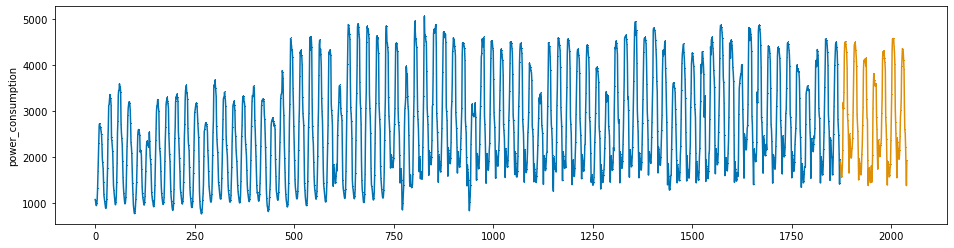

In [5]:
y = train_1.loc[train['building_number'] == 1, 'power_consumption']
x = train_1.loc[train['building_number'] == 1].drop(columns = 'power_consumption')

y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x, test_size = 168)

print('train data shape\nx:{}, y:{}'.format(x_train.shape, y_train.shape))

plot_series(y_train, y_valid, markers=[',' , ','])
plt.show()

In [6]:
def SMAPE(true, pred):
    v = 2 * abs(pred - true) / (abs(pred) + abs(true))
    output = np.mean(v) * 100
    return output

## hyperparameter tuning:GridSearchCV

In [7]:
from sklearn.model_selection import PredefinedSplit, GridSearchCV
from tqdm import tqdm
df = pd.DataFrame(columns = ['n_estimators', 'eta', 'min_child_weight','max_depth', 'colsample_bytree', 'subsample'])
preds = np.array([])
from sklearn.metrics import make_scorer
smape = make_scorer(SMAPE, greater_is_better = False)
grid = {'n_estimators' : [100], 'eta' : [0.01], 'min_child_weight' : np.arange(1, 8, 1), 
        'max_depth' : np.arange(3,9,1) , 'colsample_bytree' :np.arange(0.2, 1.0, 0.2), 
        'subsample' :np.arange(0.4, 1.0, 0.2)}
        
for i in tqdm(np.arange(1, 101)):
    y = train_1.loc[train['building_number'] == i, 'power_consumption']
    x = train_1.loc[train['building_number'] == i].drop(columns = 'power_consumption')
    #y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x, test_size = 168)
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x)
    smape = make_scorer(SMAPE, greater_is_better = False)
    pds = PredefinedSplit(np.append(-np.ones(len(x)-168), np.zeros(168)))
    gcv = GridSearchCV(estimator = XGBRegressor(seed = 0),
                       param_grid = grid, scoring = smape, cv = pds, refit = True, verbose = True)
    
    gcv.fit(x_scaled, y)
    best = gcv.best_estimator_
    params = gcv.best_params_
    print(params)
    pred = best.predict(x_scaled)
    building = 'building'+str(i)
    print(building + ' || SMAPE : {}'.format(SMAPE(y, pred)))
    preds = np.append(preds, pred)
    df = pd.concat([df, pd.DataFrame(params, index = [0])], axis = 0)
    df.to_csv('./hyperparameter_xgb.csv', index = False)

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]

Fitting 1 folds for each of 504 candidates, totalling 504 fits


  1%|▊                                                                                 | 1/100 [00:26<44:08, 26.75s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building1 || SMAPE : 43.709860255858466
Fitting 1 folds for each of 504 candidates, totalling 504 fits


  2%|█▋                                                                                | 2/100 [00:55<45:53, 28.10s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building2 || SMAPE : 44.10577413750567
Fitting 1 folds for each of 504 candidates, totalling 504 fits


  3%|██▍                                                                               | 3/100 [01:25<46:28, 28.74s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building3 || SMAPE : 40.631509819147915
Fitting 1 folds for each of 504 candidates, totalling 504 fits


  4%|███▎                                                                              | 4/100 [01:48<42:46, 26.74s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building4 || SMAPE : 44.680567918021175
Fitting 1 folds for each of 504 candidates, totalling 504 fits


  5%|████                                                                              | 5/100 [02:19<44:20, 28.00s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building5 || SMAPE : 37.84917916837384
Fitting 1 folds for each of 504 candidates, totalling 504 fits


  6%|████▉                                                                             | 6/100 [02:45<42:43, 27.27s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building6 || SMAPE : 42.08847841035628
Fitting 1 folds for each of 504 candidates, totalling 504 fits


  7%|█████▋                                                                            | 7/100 [03:13<42:41, 27.55s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building7 || SMAPE : 40.345401600355636
Fitting 1 folds for each of 504 candidates, totalling 504 fits


  8%|██████▌                                                                           | 8/100 [03:36<40:22, 26.33s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building8 || SMAPE : 44.60504300464404
Fitting 1 folds for each of 504 candidates, totalling 504 fits


  9%|███████▍                                                                          | 9/100 [04:03<40:13, 26.52s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building9 || SMAPE : 41.737459373137135
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 10%|████████                                                                         | 10/100 [04:27<38:32, 25.69s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building10 || SMAPE : 44.62467421289563
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 11%|████████▉                                                                        | 11/100 [04:49<36:28, 24.59s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building11 || SMAPE : 44.77097297097802
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 12%|█████████▋                                                                       | 12/100 [05:14<36:19, 24.76s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building12 || SMAPE : 44.7157170761129
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 13%|██████████▌                                                                      | 13/100 [05:39<35:44, 24.65s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building13 || SMAPE : 44.45461356857906
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 14%|███████████▎                                                                     | 14/100 [06:07<36:44, 25.64s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building14 || SMAPE : 42.745664554863424
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 15%|████████████▏                                                                    | 15/100 [06:31<35:33, 25.10s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building15 || SMAPE : 44.28559135228784
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 16%|████████████▉                                                                    | 16/100 [06:58<35:56, 25.68s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building16 || SMAPE : 39.485519405653555
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 17%|█████████████▊                                                                   | 17/100 [07:26<36:30, 26.39s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building17 || SMAPE : 39.922928867763815
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 18%|██████████████▌                                                                  | 18/100 [07:53<36:30, 26.71s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building18 || SMAPE : 41.434740350881945
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 19%|███████████████▍                                                                 | 19/100 [08:21<36:42, 27.19s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building19 || SMAPE : 38.816891236219156
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 20%|████████████████▏                                                                | 20/100 [08:50<36:36, 27.46s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building20 || SMAPE : 38.95663306209583
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 21%|█████████████████                                                                | 21/100 [09:16<35:53, 27.27s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building21 || SMAPE : 41.01879754329498
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 22%|█████████████████▊                                                               | 22/100 [09:40<34:00, 26.17s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building22 || SMAPE : 43.29058786107935
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 23%|██████████████████▋                                                              | 23/100 [10:03<32:23, 25.24s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building23 || SMAPE : 43.6843197065855
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 24%|███████████████████▍                                                             | 24/100 [10:29<32:26, 25.61s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building24 || SMAPE : 44.83808329040248
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 25%|████████████████████▎                                                            | 25/100 [10:55<32:04, 25.66s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building25 || SMAPE : 42.563193273097745
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 26%|█████████████████████                                                            | 26/100 [11:21<31:36, 25.63s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building26 || SMAPE : 43.17902274623158
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 27%|█████████████████████▊                                                           | 27/100 [11:45<30:41, 25.23s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building27 || SMAPE : 44.84552522389087
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 28%|██████████████████████▋                                                          | 28/100 [12:11<30:31, 25.44s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.4}
building28 || SMAPE : 42.2348238525271
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 29%|███████████████████████▍                                                         | 29/100 [12:37<30:16, 25.59s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building29 || SMAPE : 43.12463493941616
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 30%|████████████████████████▎                                                        | 30/100 [13:05<30:48, 26.41s/it]

{'colsample_bytree': 0.4, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building30 || SMAPE : 43.92455730566887
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 31%|█████████████████████████                                                        | 31/100 [13:32<30:31, 26.55s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.4}
building31 || SMAPE : 42.9170327103384
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 32%|█████████████████████████▉                                                       | 32/100 [13:47<26:14, 23.16s/it]

{'colsample_bytree': 0.4, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building32 || SMAPE : 44.82924264020033
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 33%|██████████████████████████▋                                                      | 33/100 [14:03<23:20, 20.90s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building33 || SMAPE : 44.8313751049577
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 34%|███████████████████████████▌                                                     | 34/100 [14:23<22:39, 20.59s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building34 || SMAPE : 44.83046265191686
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 35%|████████████████████████████▎                                                    | 35/100 [14:38<20:39, 19.07s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building35 || SMAPE : 44.82269859475244
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 36%|█████████████████████████████▏                                                   | 36/100 [14:53<18:55, 17.74s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building36 || SMAPE : 44.81811289292894
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 37%|█████████████████████████████▉                                                   | 37/100 [15:22<22:17, 21.24s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.4}
building37 || SMAPE : 35.021684748342345
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 38%|██████████████████████████████▊                                                  | 38/100 [15:53<24:50, 24.03s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building38 || SMAPE : 35.00357806799519
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 39%|███████████████████████████████▌                                                 | 39/100 [16:22<25:58, 25.55s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building39 || SMAPE : 36.19379884708944
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 40%|████████████████████████████████▍                                                | 40/100 [16:53<27:17, 27.30s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building40 || SMAPE : 35.28740291782963
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 41%|█████████████████████████████████▏                                               | 41/100 [17:23<27:27, 27.93s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.4}
building41 || SMAPE : 37.1016002074863
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 42%|██████████████████████████████████                                               | 42/100 [17:52<27:12, 28.15s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building42 || SMAPE : 32.75559723029424
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 43%|██████████████████████████████████▊                                              | 43/100 [18:20<26:42, 28.12s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.4}
building43 || SMAPE : 33.69342443225288
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 44%|███████████████████████████████████▋                                             | 44/100 [18:47<25:55, 27.77s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building44 || SMAPE : 32.226959795867586
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 45%|████████████████████████████████████▍                                            | 45/100 [19:11<24:28, 26.70s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building45 || SMAPE : 44.78488965584904
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 46%|█████████████████████████████████████▎                                           | 46/100 [19:37<23:53, 26.55s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building46 || SMAPE : 44.31854535400924
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 47%|██████████████████████████████████████                                           | 47/100 [20:01<22:53, 25.92s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building47 || SMAPE : 44.7797964248895
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 48%|██████████████████████████████████████▉                                          | 48/100 [20:26<22:13, 25.65s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building48 || SMAPE : 43.68372814630695
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 49%|███████████████████████████████████████▋                                         | 49/100 [20:50<21:19, 25.09s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building49 || SMAPE : 44.8076433599741
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 50%|████████████████████████████████████████▌                                        | 50/100 [21:14<20:36, 24.73s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building50 || SMAPE : 44.785689506487586
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 51%|█████████████████████████████████████████▎                                       | 51/100 [21:40<20:29, 25.10s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building51 || SMAPE : 43.64057763920643
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 52%|██████████████████████████████████████████                                       | 52/100 [22:06<20:19, 25.41s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building52 || SMAPE : 42.89678155774531
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 53%|██████████████████████████████████████████▉                                      | 53/100 [22:37<21:09, 27.01s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building53 || SMAPE : 38.270325629200975
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 54%|███████████████████████████████████████████▋                                     | 54/100 [23:08<21:32, 28.11s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building54 || SMAPE : 39.38974370113314
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 55%|████████████████████████████████████████████▌                                    | 55/100 [23:26<18:59, 25.32s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building55 || SMAPE : 44.6017976374492
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 56%|█████████████████████████████████████████████▎                                   | 56/100 [23:44<16:50, 22.96s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building56 || SMAPE : 44.769098251382054
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 57%|██████████████████████████████████████████████▏                                  | 57/100 [24:11<17:21, 24.22s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building57 || SMAPE : 39.94288608771089
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 58%|██████████████████████████████████████████████▉                                  | 58/100 [24:26<15:05, 21.55s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building58 || SMAPE : 44.82369693558439
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 59%|███████████████████████████████████████████████▊                                 | 59/100 [24:56<16:17, 23.83s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building59 || SMAPE : 36.420154487857516
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 60%|████████████████████████████████████████████████▌                                | 60/100 [25:23<16:41, 25.03s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building60 || SMAPE : 40.9174655787228
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 61%|█████████████████████████████████████████████████▍                               | 61/100 [25:51<16:46, 25.81s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building61 || SMAPE : 42.6487418909976
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 62%|██████████████████████████████████████████████████▏                              | 62/100 [26:19<16:48, 26.54s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building62 || SMAPE : 44.51652940281714
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 63%|███████████████████████████████████████████████████                              | 63/100 [26:48<16:41, 27.08s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building63 || SMAPE : 43.433058224632056
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 64%|███████████████████████████████████████████████████▊                             | 64/100 [27:14<16:13, 27.03s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building64 || SMAPE : 44.61574431495698
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 65%|████████████████████████████████████████████████████▋                            | 65/100 [27:46<16:28, 28.24s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building65 || SMAPE : 42.29797057037658
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 66%|█████████████████████████████████████████████████████▍                           | 66/100 [28:12<15:43, 27.74s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building66 || SMAPE : 44.421143870476975
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 67%|██████████████████████████████████████████████████████▎                          | 67/100 [28:39<15:11, 27.62s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building67 || SMAPE : 44.610523665146914
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 68%|███████████████████████████████████████████████████████                          | 68/100 [29:08<14:48, 27.75s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building68 || SMAPE : 44.099020598864904
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 69%|███████████████████████████████████████████████████████▉                         | 69/100 [29:33<13:54, 26.93s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building69 || SMAPE : 43.279389443063735
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 70%|████████████████████████████████████████████████████████▋                        | 70/100 [30:01<13:38, 27.28s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building70 || SMAPE : 42.56266396766394
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [30:28<13:12, 27.34s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building71 || SMAPE : 43.35189419942689
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [30:51<12:06, 25.96s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building72 || SMAPE : 44.77086317518739
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [31:14<11:15, 25.03s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building73 || SMAPE : 44.78730768107832
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [31:41<11:08, 25.72s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building74 || SMAPE : 40.88332095962341
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [32:07<10:42, 25.72s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 4, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building75 || SMAPE : 45.87847718492954
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 76%|█████████████████████████████████████████████████████████████▌                   | 76/100 [32:32<10:12, 25.52s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building76 || SMAPE : 44.79972738392463
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 77%|██████████████████████████████████████████████████████████████▎                  | 77/100 [32:58<09:52, 25.75s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building77 || SMAPE : 42.12646008239812
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 78%|███████████████████████████████████████████████████████████████▏                 | 78/100 [33:26<09:41, 26.45s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building78 || SMAPE : 39.30068327800273
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 79%|███████████████████████████████████████████████████████████████▉                 | 79/100 [33:53<09:16, 26.51s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building79 || SMAPE : 42.965640321353874
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 80%|████████████████████████████████████████████████████████████████▊                | 80/100 [34:22<09:05, 27.28s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building80 || SMAPE : 35.93468485228365
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 81%|█████████████████████████████████████████████████████████████████▌               | 81/100 [34:49<08:37, 27.23s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building81 || SMAPE : 35.94746697539561
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 82%|██████████████████████████████████████████████████████████████████▍              | 82/100 [35:18<08:19, 27.75s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building82 || SMAPE : 39.6457741244227
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 83%|███████████████████████████████████████████████████████████████████▏             | 83/100 [35:47<07:57, 28.09s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building83 || SMAPE : 38.00099407055171
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 84%|████████████████████████████████████████████████████████████████████             | 84/100 [36:15<07:29, 28.09s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building84 || SMAPE : 40.27941693861362
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 85%|████████████████████████████████████████████████████████████████████▊            | 85/100 [36:39<06:41, 26.77s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building85 || SMAPE : 44.801732983187634
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 86%|█████████████████████████████████████████████████████████████████████▋           | 86/100 [37:06<06:17, 27.00s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building86 || SMAPE : 41.84269334979979
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 87%|██████████████████████████████████████████████████████████████████████▍          | 87/100 [37:36<06:01, 27.81s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building87 || SMAPE : 43.577002344855295
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [38:05<05:37, 28.11s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 7, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.4}
building88 || SMAPE : 40.33115180410634
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [38:34<05:13, 28.46s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 8, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building89 || SMAPE : 39.862788565052455
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [39:07<04:58, 29.84s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 5, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building90 || SMAPE : 39.03783046150765
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 91%|█████████████████████████████████████████████████████████████████████████▋       | 91/100 [39:37<04:28, 29.79s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.6000000000000001}
building91 || SMAPE : 36.09917739394767
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 92%|██████████████████████████████████████████████████████████████████████████▌      | 92/100 [40:06<03:56, 29.60s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 2, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building92 || SMAPE : 39.5396422215184
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 93%|███████████████████████████████████████████████████████████████████████████▎     | 93/100 [40:33<03:21, 28.75s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building93 || SMAPE : 44.72617560710944
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 94%|████████████████████████████████████████████████████████████████████████████▏    | 94/100 [41:00<02:50, 28.47s/it]

{'colsample_bytree': 0.6000000000000001, 'eta': 0.01, 'max_depth': 4, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building94 || SMAPE : 44.55503049869211
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 95%|████████████████████████████████████████████████████████████████████████████▉    | 95/100 [41:29<02:22, 28.53s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building95 || SMAPE : 43.43421528274277
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 96%|█████████████████████████████████████████████████████████████████████████████▊   | 96/100 [41:54<01:49, 27.29s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building96 || SMAPE : 44.778464785991346
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 97%|██████████████████████████████████████████████████████████████████████████████▌  | 97/100 [42:19<01:20, 26.85s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 5, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building97 || SMAPE : 44.66873376371603
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 98%|███████████████████████████████████████████████████████████████████████████████▍ | 98/100 [42:47<00:54, 27.08s/it]

{'colsample_bytree': 0.8, 'eta': 0.01, 'max_depth': 6, 'min_child_weight': 7, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building98 || SMAPE : 44.41673518327463
Fitting 1 folds for each of 504 candidates, totalling 504 fits


 99%|████████████████████████████████████████████████████████████████████████████████▏| 99/100 [43:13<00:26, 26.75s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 6, 'n_estimators': 100, 'subsample': 0.8000000000000002}
building99 || SMAPE : 42.348894669119204
Fitting 1 folds for each of 504 candidates, totalling 504 fits


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [43:40<00:00, 26.20s/it]

{'colsample_bytree': 0.2, 'eta': 0.01, 'max_depth': 3, 'min_child_weight': 3, 'n_estimators': 100, 'subsample': 0.4}
building100 || SMAPE : 41.40342235070521


In [8]:
def weighted_mse(alpha = 1):
    def weighted_mse_fixed(label, pred):
        residual = (label - pred).astype("float")
        grad = np.where(residual>0, -2*alpha*residual, -2*residual)
        hess = np.where(residual>0, 2*alpha, 2.0)
        return grad, hess
    return weighted_mse_fixed



In [9]:
xgb_params = pd.read_csv('hyperparameter_xgb.csv')

# 테스트
xgb_reg = XGBRegressor(n_estimators = 10000, eta = xgb_params.iloc[47,1], min_child_weight = xgb_params.iloc[47,2], 
                       max_depth = xgb_params.iloc[47,3], colsample_bytree = xgb_params.iloc[47,4], 
                       subsample = xgb_params.iloc[47,5], seed=0)

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)],
        early_stopping_rounds=300,
       verbose=False)

C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.2, early_stopping_rounds=None,
             enable_categorical=False, eta=0.01, eval_metric=None,
             feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
             max_leaves=None, min_child_weight=2, missing=nan,
             monotone_constraints=None, n_estimators=10000, n_jobs=None,
             num_parallel_tree=None, predictor=None, ...)

best iterations: 6514
SMAPE : 6.248965433888663


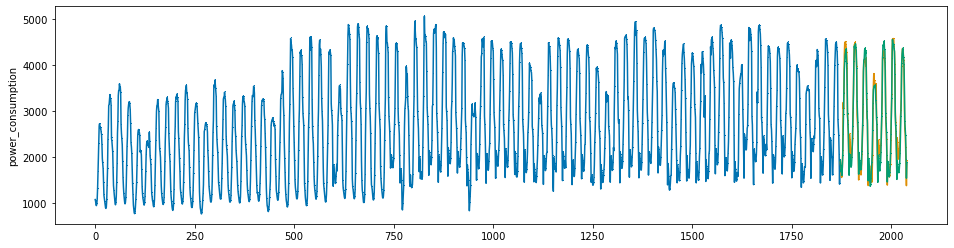

In [10]:
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred)))

In [11]:
xgb_reg = XGBRegressor(n_estimators = 10000, eta = xgb_params.iloc[47,1], min_child_weight = xgb_params.iloc[47,2], 
                       max_depth = xgb_params.iloc[47,3], colsample_bytree = xgb_params.iloc[47,4], 
                       subsample = xgb_params.iloc[47,5], seed=0)

xgb_reg.set_params(**{'objective':weighted_mse(100)})

xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), (x_valid, y_valid)],
        early_stopping_rounds=300,
       verbose=False)

C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.2, early_stopping_rounds=None,
             enable_categorical=False, eta=0.01, eval_metric=None,
             feature_types=None, gamma=None, gpu_id=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=3,
             max_leaves=None, min_child_weight=2, missing=nan,
             monotone_constraints=None, n_estimators=10000, n_jobs=None,
             num_parallel_tree=None,
             objective=<function weighted_mse.<locals>.weighted_mse_fixed at 0x000001D9E54E8B80>, ...)

best iterations: 374
SMAPE : 9.378080059209742


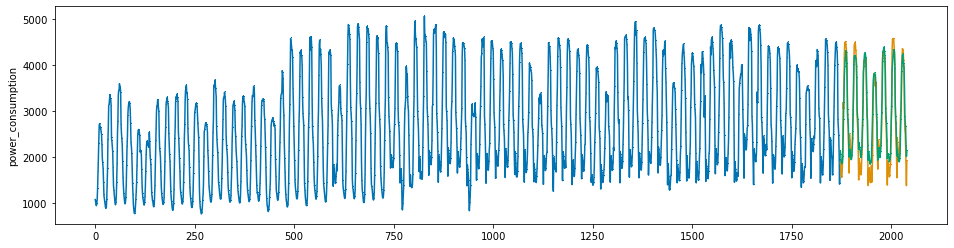

In [12]:
pred = xgb_reg.predict(x_valid)
pred = pd.Series(pred)
pred.index = np.arange(y_valid.index[0], y_valid.index[-1]+1)
plot_series(y_train, y_valid, pd.Series(pred), markers=[',' , ',', ','])

print('best iterations: {}'.format(xgb_reg.best_iteration))
print('SMAPE : {}'.format(SMAPE(y_valid, pred)))

In [13]:
train_2 = train
test_2 = test

# 카테고리 컬럼 설정
train_2[['building_type']] = train_2[[ 'building_type']].astype('category')
train_2 = pd.get_dummies(train_2, columns = ['building_type'])

scores = []   # smape 값을 저장할 list
best_it = []  # best interation을 저장할 list
for i in tqdm(range(100)):
    y = train_2.loc[train['building_number'] == i+1, 'power_consumption']
    x = train_2.loc[train['building_number'] == i+1].drop(columns = 'power_consumption')
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x)
    y_train, y_valid, x_train, x_valid = temporal_train_test_split(y = y, X = x_scaled, test_size = 168)
    
    xgb_reg = XGBRegressor(n_estimators = 10000, eta = 0.01, min_child_weight = xgb_params.iloc[i, 2],
                           max_depth = xgb_params.iloc[i, 3], colsample_bytree = xgb_params.iloc[i, 4], 
                           subsample = xgb_params.iloc[i, 5], seed=0)
    xgb_reg.set_params(**{'objective':weighted_mse(100)}) # alpha = 100으로 고정
    
    xgb_reg.fit(x_train, y_train, eval_set=[(x_train, y_train), 
                                            (x_valid, y_valid)], early_stopping_rounds=300, verbose=False)
    y_pred = xgb_reg.predict(x_valid)
    pred = pd.Series(y_pred)   
    
    sm = SMAPE(y_valid, y_pred)
    scores.append(sm)
    best_it.append(xgb_reg.best_iteration)

  0%|                                                                                          | 0/100 [00:00<?, ?it/s]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
  1%|▊                                                                                 | 1/100 [00:00<01:19,  1.24it/s]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
  2%|█▋                                                                                | 2/100 [00:01<01:19,  1.24it/s]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method

 22%|█████████████████▊                                                               | 22/100 [00:47<04:52,  3.75s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
 23%|██████████████████▋                                                              | 23/100 [00:59<08:01,  6.25s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
 24%|███████████████████▍                                                             | 24/100 [01:01<06:00,  4.74s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method

 44%|███████████████████████████████████▋                                             | 44/100 [01:52<03:04,  3.30s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
 45%|████████████████████████████████████▍                                            | 45/100 [01:54<02:27,  2.69s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
 46%|█████████████████████████████████████▎                                           | 46/100 [01:54<01:56,  2.15s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method

 66%|█████████████████████████████████████████████████████▍                           | 66/100 [02:45<00:46,  1.37s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
 67%|██████████████████████████████████████████████████████▎                          | 67/100 [02:46<00:39,  1.20s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
 68%|███████████████████████████████████████████████████████                          | 68/100 [02:47<00:34,  1.09s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method

 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [04:11<00:34,  2.90s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [04:12<00:27,  2.50s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(
 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [04:14<00:20,  2.08s/it]C:\Users\yeji4\anaconda3\lib\site-packages\xgboost\sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method

In [14]:
best_it

[355,
 261,
 214,
 328,
 7620,
 566,
 222,
 417,
 518,
 252,
 445,
 1660,
 390,
 225,
 384,
 476,
 1996,
 428,
 2334,
 8367,
 4465,
 384,
 9970,
 533,
 4258,
 384,
 438,
 267,
 354,
 1394,
 292,
 555,
 723,
 598,
 664,
 776,
 4342,
 7982,
 1447,
 476,
 4108,
 267,
 5396,
 471,
 533,
 382,
 455,
 471,
 682,
 479,
 443,
 469,
 5303,
 2385,
 485,
 522,
 9914,
 619,
 7736,
 338,
 353,
 400,
 356,
 404,
 301,
 531,
 248,
 332,
 374,
 1588,
 1063,
 627,
 392,
 1869,
 381,
 389,
 9995,
 5850,
 4185,
 2865,
 9608,
 3641,
 4169,
 8161,
 941,
 476,
 388,
 696,
 650,
 585,
 3034,
 343,
 2455,
 429,
 217,
 378,
 1114,
 316,
 349,
 480]

In [15]:
df['iteration'] = best_it

In [16]:
df

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,iteration
0,100,0.01,1,3,0.8,0.8,355
0,100,0.01,1,4,0.8,0.8,261
0,100,0.01,3,3,0.2,0.8,214
0,100,0.01,1,4,0.8,0.8,328
0,100,0.01,2,4,0.2,0.8,7620
...,...,...,...,...,...,...,...
0,100,0.01,1,5,0.8,0.8,378
0,100,0.01,3,5,0.8,0.8,1114
0,100,0.01,7,6,0.8,0.8,316
0,100,0.01,6,3,0.2,0.8,349


In [17]:
train_3 = train
test_3 = test

# 카테고리 컬럼 설정
train_3[['building_type']] = train_3[[ 'building_type']].astype('category')
train_3 = pd.get_dummies(train_3, columns = ['building_type'])

alpha_list = []
smape_list = []

for i in tqdm(range(100)):
    y = train_3.loc[train['building_number'] == i+1, 'power_consumption']
    x = train_3.loc[train['building_number'] == i+1].drop(columns = 'power_consumption')
    scaler = StandardScaler()
    x_scaled = scaler.fit_transform(x)
    y_train, y_test, x_train, x_test = temporal_train_test_split(y = y, X = x_scaled, test_size = 168)
    
    xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = df.iloc[i, 2],
                      max_depth = df.iloc[i, 3], colsample_bytree = df.iloc[i, 4], subsample = df.iloc[i, 5])
    
    xgb.fit(x_train, y_train)
    pred0 = xgb.predict(x_test)
    best_alpha = 0
    score0 = SMAPE(y_test,pred0)
    
    for j in [1, 3, 5, 7, 10, 25, 50, 75, 100]:
        xgb = XGBRegressor(seed = 0,
                      n_estimators = best_it[i], eta = 0.01, min_child_weight = df.iloc[i, 2],
                      max_depth = df.iloc[i, 3], colsample_bytree = df.iloc[i, 4], subsample = df.iloc[i, 5])
        xgb.set_params(**{'objective' : weighted_mse(j)})
    
        xgb.fit(x_train, y_train)
        pred1 = xgb.predict(x_test)
        score1 = SMAPE(y_test, pred1)
        if score1 < score0:
            best_alpha = j
            score0 = score1
    
    alpha_list.append(best_alpha)
    smape_list.append(score0)
    print("building {} || best score : {} || alpha : {}".format(i+1, score0, best_alpha))

  1%|▊                                                                                 | 1/100 [00:03<05:51,  3.55s/it]

building 1 || best score : 6.808966982685452 || alpha : 3


  2%|█▋                                                                                | 2/100 [00:06<05:10,  3.17s/it]

building 2 || best score : 10.078001646069264 || alpha : 7


  3%|██▍                                                                               | 3/100 [00:08<04:12,  2.60s/it]

building 3 || best score : 11.37895577556211 || alpha : 5


  4%|███▎                                                                              | 4/100 [00:12<04:50,  3.02s/it]

building 4 || best score : 3.643855512042323 || alpha : 100


  5%|████                                                                              | 5/100 [01:29<47:32, 30.03s/it]

building 5 || best score : 7.8581904656198835 || alpha : 1


  6%|████▉                                                                             | 6/100 [01:36<34:38, 22.11s/it]

building 6 || best score : 4.0224710002419 || alpha : 10


  7%|█████▋                                                                            | 7/100 [01:38<24:11, 15.61s/it]

building 7 || best score : 16.23329435703332 || alpha : 0


  8%|██████▌                                                                           | 8/100 [01:44<18:55, 12.34s/it]

building 8 || best score : 4.8512204798578145 || alpha : 75


  9%|███████▍                                                                          | 9/100 [01:49<15:17, 10.08s/it]

building 9 || best score : 3.6557818762881666 || alpha : 3


 10%|████████                                                                         | 10/100 [01:52<11:49,  7.88s/it]

building 10 || best score : 6.209891128884326 || alpha : 1


 11%|████████▉                                                                        | 11/100 [01:58<10:49,  7.30s/it]

building 11 || best score : 2.9765315696471473 || alpha : 25


 12%|█████████▋                                                                       | 12/100 [02:19<16:57, 11.56s/it]

building 12 || best score : 3.851022087771431 || alpha : 100


 13%|██████████▌                                                                      | 13/100 [02:23<13:32,  9.34s/it]

building 13 || best score : 4.8520029104624385 || alpha : 25


 14%|███████████▎                                                                     | 14/100 [02:26<10:21,  7.23s/it]

building 14 || best score : 15.917524557436996 || alpha : 1


 15%|████████████▏                                                                    | 15/100 [02:29<08:45,  6.18s/it]

building 15 || best score : 3.477753683184899 || alpha : 5


 16%|████████████▉                                                                    | 16/100 [02:35<08:17,  5.92s/it]

building 16 || best score : 5.4334351344339185 || alpha : 1


 17%|█████████████▊                                                                   | 17/100 [02:57<14:47, 10.70s/it]

building 17 || best score : 6.332231492408138 || alpha : 10


 18%|██████████████▌                                                                  | 18/100 [03:01<11:56,  8.73s/it]

building 18 || best score : 8.450385186243665 || alpha : 5


 19%|███████████████▍                                                                 | 19/100 [03:23<17:25, 12.90s/it]

building 19 || best score : 8.461900188222856 || alpha : 7


 20%|████████████████▏                                                                | 20/100 [04:45<44:33, 33.42s/it]

building 20 || best score : 5.363184969217602 || alpha : 100


 21%|█████████████████                                                                | 21/100 [05:34<50:25, 38.30s/it]

building 21 || best score : 6.940999444397651 || alpha : 0


 22%|█████████████████▊                                                               | 22/100 [05:38<36:20, 27.96s/it]

building 22 || best score : 5.227277840515186 || alpha : 3


 23%|██████████████████▏                                                            | 23/100 [07:15<1:02:23, 48.62s/it]

building 23 || best score : 1.8620286165263515 || alpha : 25


 24%|███████████████████▍                                                             | 24/100 [07:21<45:36, 36.00s/it]

building 24 || best score : 2.190030310716006 || alpha : 7


 25%|████████████████████▎                                                            | 25/100 [08:06<48:09, 38.53s/it]

building 25 || best score : 2.6218062111544063 || alpha : 7


 26%|█████████████████████                                                            | 26/100 [08:10<34:41, 28.14s/it]

building 26 || best score : 3.6113762201249786 || alpha : 7


 27%|█████████████████████▊                                                           | 27/100 [08:15<25:52, 21.27s/it]

building 27 || best score : 1.4351501344254396 || alpha : 75


 28%|██████████████████████▋                                                          | 28/100 [08:18<18:57, 15.80s/it]

building 28 || best score : 5.750251517809364 || alpha : 0


 29%|███████████████████████▍                                                         | 29/100 [08:22<14:19, 12.11s/it]

building 29 || best score : 5.880743311892343 || alpha : 1


 30%|████████████████████████▎                                                        | 30/100 [08:38<15:45, 13.51s/it]

building 30 || best score : 6.846525140633491 || alpha : 10


 31%|█████████████████████████                                                        | 31/100 [08:41<11:51, 10.32s/it]

building 31 || best score : 6.187640413119114 || alpha : 7


 32%|█████████████████████████▉                                                       | 32/100 [08:47<10:03,  8.88s/it]

building 32 || best score : 0.4813577175448171 || alpha : 0


 33%|██████████████████████████▋                                                      | 33/100 [08:54<09:27,  8.47s/it]

building 33 || best score : 0.34636399533644713 || alpha : 10


 34%|███████████████████████████▌                                                     | 34/100 [09:01<08:35,  7.81s/it]

building 34 || best score : 0.6109266871029879 || alpha : 75


 35%|████████████████████████████▎                                                    | 35/100 [09:07<08:09,  7.54s/it]

building 35 || best score : 0.40846900797161245 || alpha : 25


 36%|█████████████████████████████▏                                                   | 36/100 [09:15<07:59,  7.49s/it]

building 36 || best score : 0.38164218081128876 || alpha : 75


 37%|█████████████████████████████▉                                                   | 37/100 [09:56<18:30, 17.63s/it]

building 37 || best score : 4.155536812797686 || alpha : 25


 38%|██████████████████████████████▊                                                  | 38/100 [11:14<36:54, 35.72s/it]

building 38 || best score : 5.7627475611075605 || alpha : 75


 39%|███████████████████████████████▌                                                 | 39/100 [11:28<29:46, 29.29s/it]

building 39 || best score : 7.568601398828292 || alpha : 50


 40%|████████████████████████████████▍                                                | 40/100 [11:33<21:53, 21.90s/it]

building 40 || best score : 10.34250124519713 || alpha : 3


 41%|█████████████████████████████████▏                                               | 41/100 [12:12<26:38, 27.10s/it]

building 41 || best score : 4.549752225920532 || alpha : 10


 42%|██████████████████████████████████                                               | 42/100 [12:15<19:10, 19.84s/it]

building 42 || best score : 22.9103307648324 || alpha : 0


 43%|██████████████████████████████████▊                                              | 43/100 [13:17<30:50, 32.47s/it]

building 43 || best score : 6.8185114287174535 || alpha : 1


 44%|███████████████████████████████████▋                                             | 44/100 [13:22<22:31, 24.14s/it]

building 44 || best score : 8.385799473353135 || alpha : 1


 45%|████████████████████████████████████▍                                            | 45/100 [13:29<17:22, 18.96s/it]

building 45 || best score : 1.9997186100934896 || alpha : 50


 46%|█████████████████████████████████████▎                                           | 46/100 [13:33<13:05, 14.55s/it]

building 46 || best score : 4.86918014884597 || alpha : 7


 47%|██████████████████████████████████████                                           | 47/100 [13:39<10:41, 12.11s/it]

building 47 || best score : 4.251927974195352 || alpha : 1


 48%|██████████████████████████████████████▉                                          | 48/100 [13:44<08:34,  9.90s/it]

building 48 || best score : 2.5956298700238625 || alpha : 7


 49%|███████████████████████████████████████▋                                         | 49/100 [13:52<07:57,  9.37s/it]

building 49 || best score : 1.9495656968218662 || alpha : 100


 50%|████████████████████████████████████████▌                                        | 50/100 [13:58<07:02,  8.45s/it]

building 50 || best score : 2.136789636315094 || alpha : 75


 51%|█████████████████████████████████████████▎                                       | 51/100 [14:03<06:02,  7.40s/it]

building 51 || best score : 3.6274311359038496 || alpha : 7


 52%|██████████████████████████████████████████                                       | 52/100 [14:08<05:16,  6.59s/it]

building 52 || best score : 4.075636340894843 || alpha : 3


 53%|██████████████████████████████████████████▉                                      | 53/100 [15:10<18:02, 23.03s/it]

building 53 || best score : 10.960167780340493 || alpha : 5


 54%|███████████████████████████████████████████▋                                     | 54/100 [15:34<18:04, 23.58s/it]

building 54 || best score : 16.50284062595523 || alpha : 10


 55%|████████████████████████████████████████████▌                                    | 55/100 [15:40<13:37, 18.17s/it]

building 55 || best score : 1.6444133046273144 || alpha : 10


 56%|█████████████████████████████████████████████▎                                   | 56/100 [15:45<10:31, 14.34s/it]

building 56 || best score : 0.779080389467026 || alpha : 100


 57%|██████████████████████████████████████████████▏                                  | 57/100 [17:38<31:21, 43.76s/it]

building 57 || best score : 5.457904430350764 || alpha : 25


 58%|██████████████████████████████████████████████▉                                  | 58/100 [17:44<22:50, 32.63s/it]

building 58 || best score : 0.38706924377097107 || alpha : 100


 59%|███████████████████████████████████████████████▊                                 | 59/100 [19:10<33:14, 48.65s/it]

building 59 || best score : 7.364711975575519 || alpha : 50


 60%|████████████████████████████████████████████████▌                                | 60/100 [19:14<23:25, 35.13s/it]

building 60 || best score : 7.316225872644056 || alpha : 1


 61%|█████████████████████████████████████████████████▍                               | 61/100 [19:18<16:40, 25.66s/it]

building 61 || best score : 5.573213231283024 || alpha : 3


 62%|██████████████████████████████████████████████████▏                              | 62/100 [19:22<12:18, 19.43s/it]

building 62 || best score : 3.9084186813447865 || alpha : 5


 63%|███████████████████████████████████████████████████                              | 63/100 [19:26<09:06, 14.76s/it]

building 63 || best score : 5.394663089913449 || alpha : 100


 64%|███████████████████████████████████████████████████▊                             | 64/100 [19:31<07:05, 11.81s/it]

building 64 || best score : 3.3788254290169113 || alpha : 5


 65%|████████████████████████████████████████████████████▋                            | 65/100 [19:35<05:23,  9.25s/it]

building 65 || best score : 9.261090287058323 || alpha : 1


 66%|█████████████████████████████████████████████████████▍                           | 66/100 [19:40<04:38,  8.20s/it]

building 66 || best score : 3.313426563549291 || alpha : 25


 67%|██████████████████████████████████████████████████████▎                          | 67/100 [19:43<03:39,  6.65s/it]

building 67 || best score : 4.8385337926679535 || alpha : 75


 68%|███████████████████████████████████████████████████████                          | 68/100 [19:47<03:04,  5.76s/it]

building 68 || best score : 3.7572045832436167 || alpha : 1


 69%|███████████████████████████████████████████████████████▉                         | 69/100 [19:51<02:39,  5.14s/it]

building 69 || best score : 4.843210507860367 || alpha : 1


 70%|████████████████████████████████████████████████████████▋                        | 70/100 [20:08<04:24,  8.82s/it]

building 70 || best score : 3.4129257147485403 || alpha : 10


 71%|█████████████████████████████████████████████████████████▌                       | 71/100 [20:23<05:06, 10.57s/it]

building 71 || best score : 3.9474020229662745 || alpha : 0


 72%|██████████████████████████████████████████████████████████▎                      | 72/100 [20:30<04:25,  9.47s/it]

building 72 || best score : 3.74750189813387 || alpha : 75


 73%|███████████████████████████████████████████████████████████▏                     | 73/100 [20:35<03:41,  8.19s/it]

building 73 || best score : 2.7884649771301695 || alpha : 0


 74%|███████████████████████████████████████████████████████████▉                     | 74/100 [21:01<05:49, 13.45s/it]

building 74 || best score : 8.21211809016839 || alpha : 0


 75%|████████████████████████████████████████████████████████████▊                    | 75/100 [21:05<04:26, 10.66s/it]

building 75 || best score : 3.549558832674283 || alpha : 100


 76%|█████████████████████████████████████████████████████████████▌                   | 76/100 [21:11<03:40,  9.19s/it]

building 76 || best score : 4.665101052391499 || alpha : 7


 77%|██████████████████████████████████████████████████████████████▎                  | 77/100 [22:54<14:20, 37.43s/it]

building 77 || best score : 2.5604336943325423 || alpha : 0


 78%|███████████████████████████████████████████████████████████████▏                 | 78/100 [23:57<16:30, 45.02s/it]

building 78 || best score : 3.6542370710212624 || alpha : 50


 79%|███████████████████████████████████████████████████████████████▉                 | 79/100 [24:43<15:55, 45.49s/it]

building 79 || best score : 2.483186573129345 || alpha : 10


 80%|████████████████████████████████████████████████████████████████▊                | 80/100 [25:14<13:40, 41.02s/it]

building 80 || best score : 4.351930400715748 || alpha : 7


 81%|█████████████████████████████████████████████████████████████████▌               | 81/100 [26:48<18:00, 56.89s/it]

building 81 || best score : 3.618187861543913 || alpha : 0


 82%|██████████████████████████████████████████████████████████████████▍              | 82/100 [27:39<16:33, 55.21s/it]

building 82 || best score : 5.603020149237 || alpha : 0


 83%|███████████████████████████████████████████████████████████████████▏             | 83/100 [28:25<14:52, 52.52s/it]

building 83 || best score : 3.780631596577316 || alpha : 3


 84%|████████████████████████████████████████████████████████████████████             | 84/100 [29:50<16:34, 62.15s/it]

building 84 || best score : 2.9282663003660296 || alpha : 7


 85%|████████████████████████████████████████████████████████████████████▊            | 85/100 [30:04<11:55, 47.67s/it]

building 85 || best score : 3.151754635874445 || alpha : 100


 86%|█████████████████████████████████████████████████████████████████████▋           | 86/100 [30:08<08:06, 34.78s/it]

building 86 || best score : 5.39399957598952 || alpha : 3


 87%|██████████████████████████████████████████████████████████████████████▍          | 87/100 [30:13<05:34, 25.72s/it]

building 87 || best score : 8.070338062933843 || alpha : 100


 88%|███████████████████████████████████████████████████████████████████████▎         | 88/100 [30:21<04:06, 20.51s/it]

building 88 || best score : 8.137752475546051 || alpha : 0


 89%|████████████████████████████████████████████████████████████████████████         | 89/100 [30:30<03:07, 17.04s/it]

building 89 || best score : 10.477763418996647 || alpha : 0


 90%|████████████████████████████████████████████████████████████████████████▉        | 90/100 [30:36<02:16, 13.66s/it]

building 90 || best score : 8.695656917637432 || alpha : 5


 91%|█████████████████████████████████████████████████████████████████████████▋       | 91/100 [31:07<02:50, 18.89s/it]

building 91 || best score : 12.757248245265279 || alpha : 1


 92%|██████████████████████████████████████████████████████████████████████████▌      | 92/100 [31:11<01:53, 14.23s/it]

building 92 || best score : 6.520631882792709 || alpha : 3


 93%|███████████████████████████████████████████████████████████████████████████▎     | 93/100 [31:47<02:25, 20.85s/it]

building 93 || best score : 5.7523517856944935 || alpha : 1


 94%|████████████████████████████████████████████████████████████████████████████▏    | 94/100 [31:52<01:36, 16.10s/it]

building 94 || best score : 6.193545637491303 || alpha : 3


 95%|████████████████████████████████████████████████████████████████████████████▉    | 95/100 [31:54<00:59, 11.99s/it]

building 95 || best score : 13.368961012009176 || alpha : 1


 96%|█████████████████████████████████████████████████████████████████████████████▊   | 96/100 [31:59<00:39,  9.92s/it]

building 96 || best score : 2.5639059075682566 || alpha : 0


 97%|██████████████████████████████████████████████████████████████████████████████▌  | 97/100 [32:14<00:34, 11.49s/it]

building 97 || best score : 4.3094537053547475 || alpha : 100


 98%|███████████████████████████████████████████████████████████████████████████████▍ | 98/100 [32:19<00:18,  9.49s/it]

building 98 || best score : 13.097555140821829 || alpha : 0


 99%|████████████████████████████████████████████████████████████████████████████████▏| 99/100 [32:23<00:07,  7.66s/it]

building 99 || best score : 4.497429451575211 || alpha : 1


100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [32:27<00:00, 19.48s/it]

building 100 || best score : 5.775273736359253 || alpha : 3


In [18]:
df['alpha'] = alpha_list

In [19]:
df

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,iteration,alpha
0,100,0.01,1,3,0.8,0.8,355,3
0,100,0.01,1,4,0.8,0.8,261,7
0,100,0.01,3,3,0.2,0.8,214,5
0,100,0.01,1,4,0.8,0.8,328,100
0,100,0.01,2,4,0.2,0.8,7620,1
...,...,...,...,...,...,...,...,...
0,100,0.01,1,5,0.8,0.8,378,0
0,100,0.01,3,5,0.8,0.8,1114,100
0,100,0.01,7,6,0.8,0.8,316,0
0,100,0.01,6,3,0.2,0.8,349,1


<BarContainer object of 100 artists>

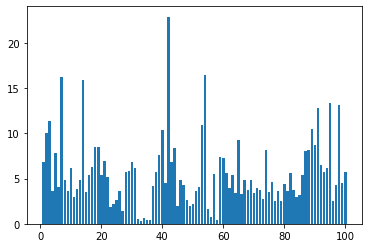

In [20]:
no_df = pd.DataFrame({'score':smape_list})
plt.bar(np.arange(len(no_df))+1, no_df['score'])

In [21]:
smape_list

[6.808966982685452,
 10.078001646069264,
 11.37895577556211,
 3.643855512042323,
 7.8581904656198835,
 4.0224710002419,
 16.23329435703332,
 4.8512204798578145,
 3.6557818762881666,
 6.209891128884326,
 2.9765315696471473,
 3.851022087771431,
 4.8520029104624385,
 15.917524557436996,
 3.477753683184899,
 5.4334351344339185,
 6.332231492408138,
 8.450385186243665,
 8.461900188222856,
 5.363184969217602,
 6.940999444397651,
 5.227277840515186,
 1.8620286165263515,
 2.190030310716006,
 2.6218062111544063,
 3.6113762201249786,
 1.4351501344254396,
 5.750251517809364,
 5.880743311892343,
 6.846525140633491,
 6.187640413119114,
 0.4813577175448171,
 0.34636399533644713,
 0.6109266871029879,
 0.40846900797161245,
 0.38164218081128876,
 4.155536812797686,
 5.7627475611075605,
 7.568601398828292,
 10.34250124519713,
 4.549752225920532,
 22.9103307648324,
 6.8185114287174535,
 8.385799473353135,
 1.9997186100934896,
 4.86918014884597,
 4.251927974195352,
 2.5956298700238625,
 1.9495656968218662,

In [22]:
for i in range(len(smape_list)):
    if smape_list[i] > 10:
        print(i+1)

2
3
7
14
40
42
53
54
89
91
95
98


In [30]:
building = pd.read_csv("building_info.csv", encoding = 'utf-8')
building.to_csv("building_info.csv", encoding = 'cp949')

In [24]:
train_3.loc[(train_3.building_number == 2)| (train_3.building_number == 3)|(train_3.building_number == 7)
           |(train_3.building_number ==14)|(train_3.building_number ==40)|(train_3.building_number ==42)
           |(train_3.building_number ==53)|(train_3.building_number ==54)|(train_3.building_number ==89)
           |(train_3.building_number ==91)|(train_3.building_number ==95)|(train_3.building_number ==98),]

,building_number,temperature,windspeed,humidity,power_consumption,day,month,day_of_week,cos_time,sin_time,...,building_type_Data Center,building_type_Department Store and Outlet,building_type_Discount Mart,building_type_Hospital,building_type_Hotel and Resort,building_type_Knowledge Industry Center,building_type_Other Buildings,building_type_Public,building_type_Research Institute,building_type_University
2040,2,18.6,0.9,42.0,1170.36,1,6,2,1.000000,0.000000,...,0,0,0,0,0,0,1,0,0,0
2041,2,18.0,1.1,45.0,1146.96,1,6,2,0.965926,0.258819,...,0,0,0,0,0,0,1,0,0,0
2042,2,17.7,1.5,45.0,1115.28,1,6,2,0.866025,0.500000,...,0,0,0,0,0,0,1,0,0,0
2043,2,16.7,1.4,48.0,1107.00,1,6,2,0.707107,0.707107,...,0,0,0,0,0,0,1,0,0,0
2044,2,18.4,2.8,43.0,1069.92,1,6,2,0.500000,0.866025,...,0,0,0,0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
199915,98,21.6,2.6,79.0,1107.00,24,8,2,0.258819,-0.965926,...,0,0,0,0,1,0,0,0,0,0
199916,98,21.2,1.2,84.0,1053.18,24,8,2,0.500000,-0.866025,...,0,0,0,0,1,0,0,0,0,0
199917,98,21.3,1.4,84.0,971.82,24,8,2,0.707107,-0.707107,...,0,0,0,0,1,0,0,0,0,0
199918,98,21.0,1.1,86.0,815.94,24,8,2,0.866025,-0.500000,...,0,0,0,0,1,0,0,0,0,0


In [39]:
no_df.describe()

,score
count,100.000000
mean,5.572426
std,3.770119
min,0.346773
25%,3.377486
50%,4.838860
75%,6.840043
max,21.379405


In [75]:
no_df

,score
0,6.819179
1,10.047074
2,11.378956
3,3.637724
4,7.936575
...,...
95,2.566494
96,4.367800
97,13.096890
98,4.498470


In [41]:
df.to_csv("parameter_final.csv", index = False)

In [52]:
xgb_params = pd.read_csv("parameter_final.csv")

In [53]:
xgb_params

,n_estimators,eta,min_child_weight,max_depth,colsample_bytree,subsample,alpha,iteration
0,100,0.01,1,3,0.8,0.8,3,358
1,100,0.01,1,4,0.8,0.8,10,264
2,100,0.01,3,3,0.2,0.8,5,214
3,100,0.01,1,4,0.8,0.8,75,328
4,100,0.01,2,4,0.2,0.8,1,6885
...,...,...,...,...,...,...,...,...
95,100,0.01,1,5,0.8,0.8,0,378
96,100,0.01,3,5,0.8,0.8,100,1567
97,100,0.01,7,6,0.8,0.8,0,324
98,100,0.01,6,3,0.2,0.8,1,349


In [76]:
train = pd.read_csv("pre_ver5/pre_train.csv")
test = pd.read_csv("pre_ver5/pre_test.csv")

In [77]:
train_4 = train
test_4 = test

# 카테고리 컬럼 설정
train_4[['building_type']] = train_4[[ 'building_type']].astype('category')
test_4[['building_type']] = test_4[['building_type']].astype('category')

train_4 = pd.get_dummies(train_4, columns = ['building_type'])
test_4 = pd.get_dummies(test_4, columns = ['building_type'])


In [105]:
preds = np.array([]) 
for i in tqdm(range(100)):
    
    pred_df = pd.DataFrame()  
    
    for seed in [0,1,2,3,4,5]: 
        y_train = train_4.loc[train_4['building_number'] == i+1, 'power_consumption']
        x_train = train_4.loc[train_4['building_number'] == i+1].drop(columns = 'power_consumption')
        x_test = test_4
        
        # 데이터 정규화
        scaler = StandardScaler()
        
        X_train_scaled= scaler.fit_transform(x_train)
        #y_train_scaled=scaler.fit_transform(np.array(y_train).reshape(-1, 1))
        
        xgb = XGBRegressor(seed = seed, n_estimators = best_it[i], eta = 0.01, 
                           min_child_weight = xgb_params.iloc[i, 2], max_depth = xgb_params.iloc[i, 3], 
                           colsample_bytree=xgb_params.iloc[i, 4], subsample=xgb_params.iloc[i, 5])
    
        if xgb_params.iloc[i,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
            xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i,6])})
        
        xgb.fit(X_train_scaled, y_train)
        x_test = scaler.fit_transform(x_test)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기
        
    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)
    

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [22:05<00:00, 13.25s/it]


In [106]:
preds

array([2250.06030273, 2166.13842773, 2096.04199219, ...,  647.86993408,
        635.9598999 ,  591.84417725])

In [107]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = train_4.loc[train_4.building_number == i+1, 'power_consumption'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040) , train_4.loc[train_4.building_number == i+1, 'power_consumption'])
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
#plt.savefig('./predict_xgb.png')
plt.show()

In [73]:
preds = np.array([]) 
for i in tqdm(range(100)):
    
    pred_df = pd.DataFrame()  
    
    for seed in [0,1,2,3,4,5]: 
        y_train = train_4.loc[train_4['building_number'] == i+1, 'power_consumption']
        x_train = train_4.loc[train_4['building_number'] == i+1].drop(columns = 'power_consumption')
        x_test = test_4
        
        xgb = XGBRegressor(seed = seed, n_estimators = best_it[i], eta = 0.01, 
                           min_child_weight = xgb_params.iloc[i, 2], max_depth = xgb_params.iloc[i, 3], 
                           colsample_bytree=xgb_params.iloc[i, 4], subsample=xgb_params.iloc[i, 5])
    
#         if xgb_params.iloc[i,6] != 0:  # 만약 alpha가 0이 아니면 weighted_mse 사용
#             xgb.set_params(**{'objective':weighted_mse(xgb_params.iloc[i,6])})
        
        xgb.fit(x_train, y_train)
        y_pred = xgb.predict(x_test)
        pred_df.loc[:,seed] = y_pred   # 각 시드별 예측 담기
        
    pred = pred_df.mean(axis=1)        # (i+1)번째 건물의 예측 =  (i+1)번째 건물의 각 시드별 예측 평균값
    preds = np.append(preds, pred)   

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [10:11<00:00,  6.11s/it]


In [74]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = train.loc[train.building_number == i+1, 'power_consumption'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040) , train.loc[train.building_number == i+1, 'power_consumption'])
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
#plt.savefig('./predict_xgb.png')
plt.show()

In [80]:
feature_importance = pd.DataFrame(xgb.feature_importances_.reshape((1, -1)), columns=x_train.columns, index=['feature_importance'])
feature_importance = feature_importance.transpose()
feature_importance

,feature_importance
Unnamed: 0,0.011624
building_number,0.000000
temperature,0.064847
windspeed,0.015775
humidity,0.034686
day,0.002766
month,0.018309
day_of_week,0.002216
cos_time,0.143053
sin_time,0.032593


In [60]:
preds = pd.Series(preds)

fig, ax = plt.subplots(100, 1, figsize=(100,200), sharex = True)
ax = ax.flatten()
for i in range(100):
    train_y = train.loc[train.building_number == i+1, 'power_consumption'].reset_index(drop = True)
    test_y = preds[i*168:(i+1)*168]
    ax[i].scatter(np.arange(2040) , train.loc[train.building_number == i+1, 'power_consumption'])
    ax[i].scatter(np.arange(2040, 2040+168) , test_y)
    ax[i].tick_params(axis='both', which='major', labelsize=6)
    ax[i].tick_params(axis='both', which='minor', labelsize=4)
#plt.savefig('./predict_xgb.png')
plt.show()

In [108]:
submission = pd.read_csv('sample_submission.csv')
submission['answer'] = preds
submission.to_csv('submission_xgb_noclip.csv', index = False)

In [69]:
train_5 = train
test_5 = test

# 카테고리 컬럼 설정
train_5[['building_type']] = train_5[[ 'building_type']].astype('category')
test_5[['building_type']] = test_5[['building_type']].astype('category')

train_5 = pd.get_dummies(train_5, columns = ['building_type'])
test_5 = pd.get_dummies(test_5, columns = ['building_type'])

## submission 불러오기
df = pd.read_csv('submission_xgb_02.csv')
for i in range(100):
    min_data = train_5.loc[train_5.building_number == i+1, ].iloc[-28*24:, :]
    ## 요일별, 시간대별 최솟값 계산
    min_data = pd.pivot_table(min_data, values = 'power_consumption', index = ['day', 'hour'], aggfunc = min).reset_index() 
    pred = df.answer[168*i:168*(i+1)].reset_index(drop=True) ## 168개 데이터, 즉 건물별 예측값 불러오기
    day =  test_5.day[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 요일 불러오기
    hour = test_5.hour[168*i:168*(i+1)].reset_index(drop=True) ## 예측값 시간 불러오기
    df_pred = pd.concat([pred, day, hour], axis = 1)
    df_pred.columns = ['pred', 'day', 'hour']
    for j in range(len(df_pred)):
        min_power = min_data.loc[(min_data.day == df_pred.day[j])&(min_data.hour == df_pred.hour[j]), 'power_consumption'].values[0]
        if df_pred.pred[j] < min_power:
            pred_clip.append(min_power)
        else:
            pred_clip.append(df_pred.pred[j])

KeyError: 'hour'